In [64]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Data Analysis

In [65]:
#load dataset
titanic_df = pd.read_csv("titanic_data.csv")
titanic_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1309 entries, 0 to 1308
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Pclass    1309 non-null   int64  
 1   Name      1309 non-null   object 
 2   Sex       1309 non-null   object 
 3   Age       1046 non-null   float64
 4   SibSp     1309 non-null   int64  
 5   Parch     1309 non-null   int64  
 6   Ticket    1309 non-null   object 
 7   Fare      1308 non-null   float64
 8   Cabin     295 non-null    object 
 9   Embarked  1307 non-null   object 
 10  Survived  1309 non-null   int64  
dtypes: float64(2), int64(4), object(5)
memory usage: 112.6+ KB


In [66]:
titanic_df.head()

,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived
0,1,"Allen, Miss. Elisabeth Walton",female,29.0,0,0,24160,211.34,B5,S,1
1,1,"Allison, Master. Hudson Trevor",male,1.0,1,2,113781,151.55,C22 C26,S,1
2,1,"Allison, Miss. Helen Loraine",female,2.0,1,2,113781,151.55,C22 C26,S,0
3,1,"Allison, Mr. Hudson Joshua Creighton",male,30.0,1,2,113781,151.55,C22 C26,S,0
4,1,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",female,25.0,1,2,113781,151.55,C22 C26,S,0


In [67]:
titanic_df.describe()

,Pclass,Age,SibSp,Parch,Fare,Survived
count,1309.000000,1046.000000,1309.000000,1309.000000,1308.000000,1309.000000
mean,2.294882,29.897706,0.498854,0.385027,33.296261,0.381971
std,0.837836,14.414973,1.041658,0.865560,51.758691,0.486055
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,21.000000,0.000000,0.000000,7.900000,0.000000
50%,3.000000,28.000000,0.000000,0.000000,14.450000,0.000000
75%,3.000000,39.000000,1.000000,0.000000,31.280000,1.000000
max,3.000000,80.000000,8.000000,9.000000,512.330000,1.000000


In [68]:
import pandas_profiling

In [69]:
# Search for overall trends in the dataset
pandas_profiling.ProfileReport(titanic_df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 2. Data Cleaning

In [70]:
#Age is skewed and has a significant number of missing values. Replace missing values with median of data
age_median = titanic_df['Age'].median(skipna=True)
titanic_df['Age'].fillna(age_median, inplace=True)

In [71]:
#Cabin has too many missing values and will be completely dropped from the dataframe
titanic_df.drop('Cabin', axis=1, inplace=True)

In [72]:
#Embarked only has 2 missing values and can be replaced with the most common which is S
titanic_df['Embarked'].fillna("S", inplace=True)

In [73]:
#Fare has one missing value and can be replaced with the median because it is highly skewed
fare_median = titanic_df['Fare'].median(skipna=True)
titanic_df['Fare'].fillna(fare_median, inplace=True)

In [74]:
titanic_df.head()

,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked,Survived
0,1,"Allen, Miss. Elisabeth Walton",female,29.0,0,0,24160,211.34,S,1
1,1,"Allison, Master. Hudson Trevor",male,1.0,1,2,113781,151.55,S,1
2,1,"Allison, Miss. Helen Loraine",female,2.0,1,2,113781,151.55,S,0
3,1,"Allison, Mr. Hudson Joshua Creighton",male,30.0,1,2,113781,151.55,S,0
4,1,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",female,25.0,1,2,113781,151.55,S,0


## 3. Feature Engineering

In [75]:
#SibSp - Number of siblings/spouses aboard
#Parch - Number of parents/children aboard
#These two variables overlap for every passenger that has this data so I am creating a variable that just detects 
#whether someone is traveling alone or not to account for multicollinearity
titanic_df['TravelGroup']=titanic_df['SibSp']+titanic_df['Parch']
titanic_df['TravelAlone']=titanic_df['TravelGroup'].apply(lambda x: 1 if x==0 else 0)
titanic_df.head()

,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked,Survived,TravelGroup,TravelAlone
0,1,"Allen, Miss. Elisabeth Walton",female,29.0,0,0,24160,211.34,S,1,0,1
1,1,"Allison, Master. Hudson Trevor",male,1.0,1,2,113781,151.55,S,1,3,0
2,1,"Allison, Miss. Helen Loraine",female,2.0,1,2,113781,151.55,S,0,3,0
3,1,"Allison, Mr. Hudson Joshua Creighton",male,30.0,1,2,113781,151.55,S,0,3,0
4,1,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",female,25.0,1,2,113781,151.55,S,0,3,0


In [76]:
#Does total size of group change the probability of surviving? 
#Initial thought: People who want to check up on the safety of more people take more time looking for them 
#and die as a result of not trying to escape
titanic_df['TravelTotal'] = titanic_df['TravelGroup'] + 1

In [77]:
#Drop unnecessary variables
titanic_df.drop('Name', axis=1, inplace=True)
titanic_df.drop('SibSp', axis=1, inplace=True)
titanic_df.drop('Parch', axis=1, inplace=True)
titanic_df.drop('Ticket', axis=1, inplace=True)
titanic_df.drop('TravelGroup', axis=1, inplace=True)

In [78]:
titanic_df.head()

,Pclass,Sex,Age,Fare,Embarked,Survived,TravelAlone,TravelTotal
0,1,female,29.0,211.34,S,1,1,1
1,1,male,1.0,151.55,S,1,0,4
2,1,female,2.0,151.55,S,0,0,4
3,1,male,30.0,151.55,S,0,0,4
4,1,female,25.0,151.55,S,0,0,4


In [79]:
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler

#### Label Encoding for categorical variables

In [80]:
#Hot Encode PClass, Sex, Embarked
label_encoder = preprocessing.LabelEncoder()
pclass_cat = label_encoder.fit_transform(titanic_df.Pclass)
sex_cat = label_encoder.fit_transform(titanic_df.Sex)
embarked_cat = label_encoder.fit_transform(titanic_df.Embarked)

#Initialize the encoded categorical columns
titanic_df['pclass_cat'] = pclass_cat
titanic_df['sex_cat'] = sex_cat
titanic_df['embarked_cat'] = embarked_cat

#Drop old categorical fields from dataframe and reindex
dummy_fields = ['Pclass','Sex','Embarked']
data = titanic_df.drop(dummy_fields, axis = 1)
data = titanic_df.reindex(['pclass_cat','sex_cat','Age','Fare','embarked_cat','TravelAlone', 'TravelTotal','Survived'],axis=1)

In [81]:
data

,pclass_cat,sex_cat,Age,Fare,embarked_cat,TravelAlone,TravelTotal,Survived
0,0,0,29.0,211.34,2,1,1,1
1,0,1,1.0,151.55,2,0,4,1
2,0,0,2.0,151.55,2,0,4,0
3,0,1,30.0,151.55,2,0,4,0
4,0,0,25.0,151.55,2,0,4,0
...,...,...,...,...,...,...,...,...
1304,2,0,15.0,14.45,0,0,2,0
1305,2,0,28.0,14.45,0,0,2,0
1306,2,1,27.0,7.23,0,1,1,0
1307,2,1,27.0,7.23,0,1,1,0


In [82]:
#Normalize the continuous variables
continuous_var = ['Age', 'Fare', 'TravelTotal']

scaler = StandardScaler()

for var in continuous_var:
    data[var] = data[var].astype('float64')
    data[var] = scaler.fit_transform(data[var].values.reshape(-1, 1))

In [83]:
data

,pclass_cat,sex_cat,Age,Fare,embarked_cat,TravelAlone,TravelTotal,Survived
0,0,0,-0.040027,3.442616,2,1,-0.558346,1
1,0,1,-2.210230,2.286623,2,0,1.336749,1
2,0,0,-2.132722,2.286623,2,0,1.336749,0
3,0,1,0.037481,2.286623,2,0,1.336749,0
4,0,0,-0.350056,2.286623,2,0,1.336749,0
...,...,...,...,...,...,...,...,...
1304,2,0,-1.125128,-0.364099,0,0,0.073352,0
1305,2,0,-0.117534,-0.364099,0,0,0.073352,0
1306,2,1,-0.195041,-0.503693,0,1,-0.558346,0
1307,2,1,-0.195041,-0.503693,0,1,-0.558346,0


In [84]:
#Make sure data is clean/check for null
data[data.isnull().any(axis=1)].head()

,pclass_cat,sex_cat,Age,Fare,embarked_cat,TravelAlone,TravelTotal,Survived


## 4. Model Building

In [85]:
from sklearn.model_selection import train_test_split
#Split inputs and output
X = data.iloc[:, 0:7] 
Y = data.iloc[:, 7]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2) 

### 4.1 Naive Bayes Classifier

In [86]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
#NB - All columns
#Initialize + fit model
gnb = GaussianNB().fit(X_train, y_train)

#training accuracy
print("Training Accuracy:",gnb.score(X_train,y_train))

Training Accuracy: 0.789875835721108


Model Evaluation with test dataset

In [87]:
#Predictions
y_pred = gnb.predict(X_test)

#Accuracy Score
NB_all_accuracy = accuracy_score(y_test,y_pred)
print('Naive Bayes Model Test Accuracy with all attributes: {0:.2f}'.format(NB_all_accuracy))

Naive Bayes Model Test Accuracy with all attributes: 0.75


Using Confusion matrix heatmap to visualize the model accuracy

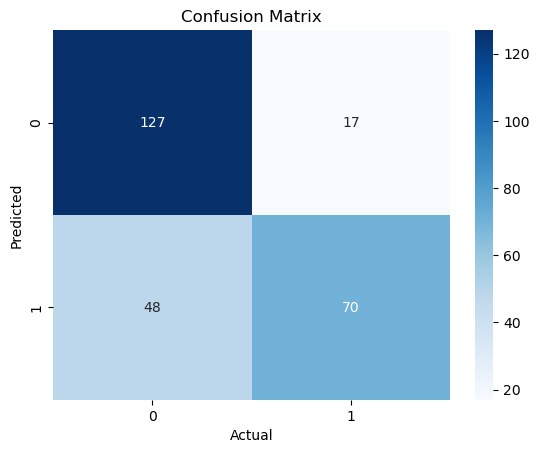

In [88]:
from sklearn.metrics import confusion_matrix
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.show()

Naive Bayes Classification Report

In [89]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.73      0.88      0.80       144
           1       0.80      0.59      0.68       118

    accuracy                           0.75       262
   macro avg       0.77      0.74      0.74       262
weighted avg       0.76      0.75      0.75       262



The model gives pretty decent results with an accuracy of 76%.

### 4.2 Decision Tree

In [90]:
from sklearn.tree import DecisionTreeClassifier
#Initialize Model
dtree = DecisionTreeClassifier(criterion = 'entropy', min_samples_split = 2, random_state=5)
# Fit train dataset into model
dtree.fit(X_train, y_train)

#training accuracy
print("Training Accuracy:",dtree.score(X_train,y_train))

Training Accuracy: 0.9656160458452722


Model Evaluation with test dataset

In [91]:
d_pred = dtree.predict(X_test)
#Accuracy Score
tree_all_accuracy = accuracy_score(y_test, d_pred)
print('Decision Tree Accuracy with all attributes: {0:.2f}'.format(tree_all_accuracy))

Decision Tree Accuracy with all attributes: 0.76


Using Confusion matrix heatmap to visualize the model accuracy

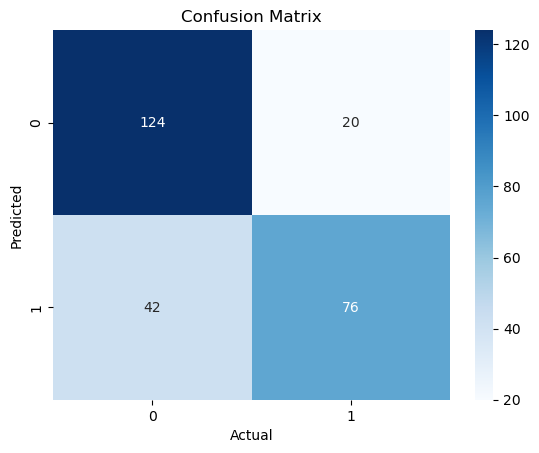

In [92]:
from sklearn.metrics import confusion_matrix

sns.heatmap(confusion_matrix(y_test, d_pred), annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.show()

Decision Tree Classification Report

In [93]:
from sklearn.metrics import classification_report
print(classification_report(y_test, d_pred))

              precision    recall  f1-score   support

           0       0.75      0.86      0.80       144
           1       0.79      0.64      0.71       118

    accuracy                           0.76       262
   macro avg       0.77      0.75      0.76       262
weighted avg       0.77      0.76      0.76       262



The model gives pretty decent results with an accuracy of 77%.

### Tree Vizualization

In [94]:
from sklearn.tree import export_graphviz
from io import StringIO
import pydotplus
from IPython.display import Image 

In [95]:
#Tree visualization function
def visualize_tree(tree_data, names):
    dot_data = StringIO()
    export_graphviz(tree_data,out_file=dot_data,
                         feature_names=names,
                         filled=True,rounded=True, 
                         special_characters=True)
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return Image(graph.create_png())

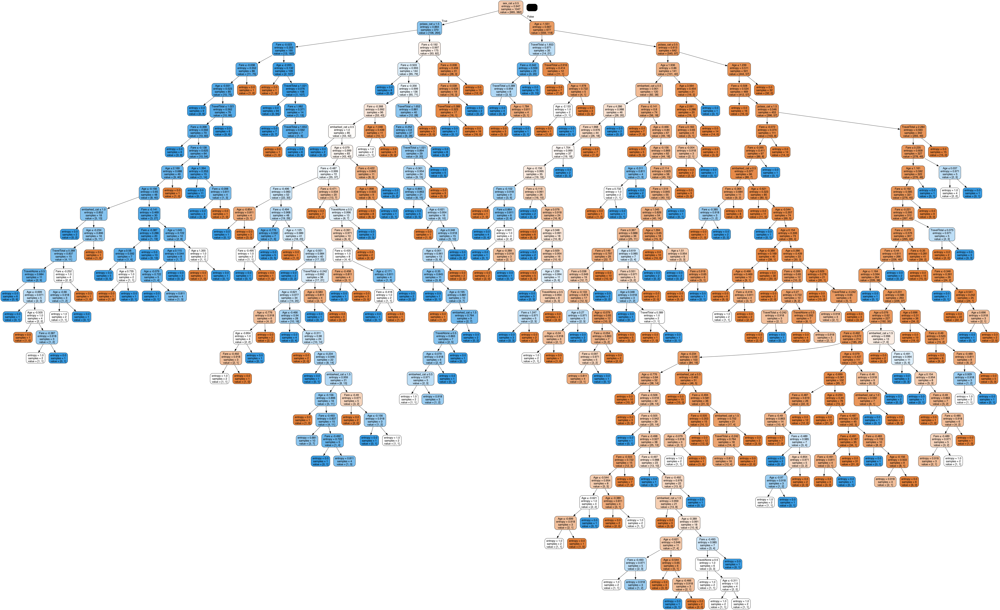

In [96]:
#DT1 Graph
names = ['pclass_cat','sex_cat','Age','Fare','embarked_cat','TravelAlone','TravelTotal']
visualize_tree(dtree,names)

In [97]:
print(dtree.feature_importances_)

[0.10548151 0.24310167 0.2597321  0.28763773 0.02402623 0.01174241
 0.06827835]


### Retrain with less features, only run for top 3 features

In [98]:
high_importance = ['sex_cat','Age','Fare']
X_train2 = X_train[high_importance]
X_test2 = X_test[high_importance]

In [99]:
#DT2 - Top 3 features only
#Initialize + fit model
dtree2 = DecisionTreeClassifier(criterion = 'gini', min_samples_split = 2, random_state=5)
dtree2.fit(X_train2, y_train)

#Predictions 
d_pred2 = dtree2.predict(X_test2)

#Accuracy Score
tree_imp_accuracy = accuracy_score(y_test, d_pred2)
print('Decision Tree Accuracy with high importance attributes: {0:.2f}'.format(tree_imp_accuracy))

Decision Tree Accuracy with high importance attributes: 0.74


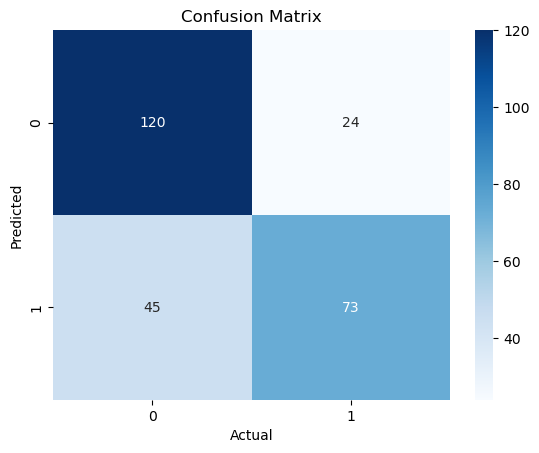

In [100]:
sns.heatmap(confusion_matrix(y_test, d_pred2), annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.show()

In [101]:
print(classification_report(y_test, d_pred2))

              precision    recall  f1-score   support

           0       0.73      0.83      0.78       144
           1       0.75      0.62      0.68       118

    accuracy                           0.74       262
   macro avg       0.74      0.73      0.73       262
weighted avg       0.74      0.74      0.73       262



The model gives pretty decent results with an accuracy of 73%.

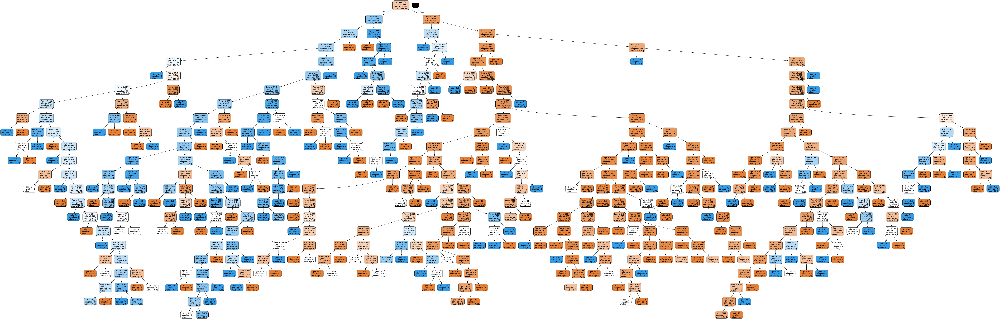

In [102]:
visualize_tree(dtree2,high_importance)

### 4.3 Random Forest

In [103]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_jobs=2, random_state=0).fit(X_train, y_train)

#Training accuracy
print("Training accuracy: ",rfc.score(X_train,y_train))

Training accuracy:  0.9656160458452722


Random Forest Evaluation

In [104]:
rfc_pred = rfc.predict(X_test)

#Evaluation Accuracy Score
RF_all_accuracy = accuracy_score(y_test,rfc_pred)
print('Random Forest Accuracy with all attributes: {0:.2f}'.format(RF_all_accuracy))

Random Forest Accuracy with all attributes: 0.77


In [105]:
print(classification_report(y_test, rfc_pred))

              precision    recall  f1-score   support

           0       0.76      0.83      0.80       144
           1       0.77      0.69      0.73       118

    accuracy                           0.77       262
   macro avg       0.77      0.76      0.76       262
weighted avg       0.77      0.77      0.77       262



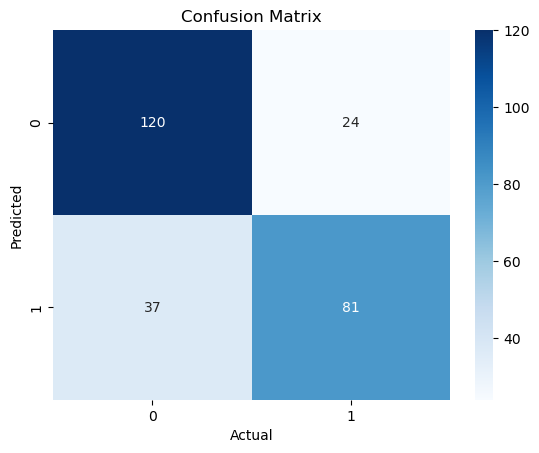

In [106]:
# Using Confusion matrix heatmap to visualize the model accuracy
sns.heatmap(confusion_matrix(y_test, rfc_pred), annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.show()

In [107]:
print(rfc.feature_importances_)

[0.07653125 0.26807775 0.2630576  0.27687481 0.03217936 0.01290811
 0.07037114]


### Retrain with less features, only run for top 3 features

In [108]:
#RF2 - Top 3 features only
#Initialize + fit model
rfc2 = RandomForestClassifier(n_jobs=2, random_state=0).fit(X_train2, y_train)

#Predictions
rfc_pred2 = rfc2.predict(X_test2)

#Accuracy Score
RF_imp_accuracy = accuracy_score(y_test,rfc_pred2)
print('Random Forest Accuracy with high importance attributes: {0:.2f}'.format(RF_imp_accuracy))

Random Forest Accuracy with high importance attributes: 0.77


In [109]:
print(classification_report(y_test, rfc_pred2))

              precision    recall  f1-score   support

           0       0.75      0.85      0.80       144
           1       0.79      0.66      0.72       118

    accuracy                           0.77       262
   macro avg       0.77      0.76      0.76       262
weighted avg       0.77      0.77      0.76       262



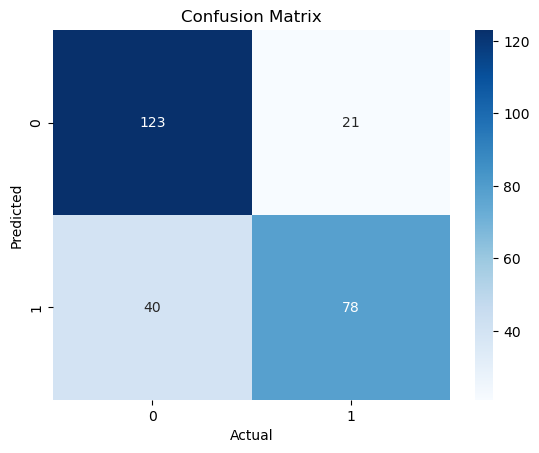

In [110]:
# Using Confusion matrix heatmap to visualize the model accuracy
sns.heatmap(confusion_matrix(y_test, rfc_pred2), annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.show()

### 4.4 Neural Network

In [111]:
from numpy.random import seed
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout

In [117]:
def create_nn_model(lyrs=[8], act='linear', opt='Adam', dr=0.0):
    # set random seed for reproducibility
    seed(42)

    model = Sequential()
    # create first hidden layer
    model.add(Dense(lyrs[0], input_dim=X_train.shape[1], activation=act))
    # create additional hidden layers
    for i in range(1,len(lyrs)):
        model.add(Dense(lyrs[i], activation=act))
    # add dropout, default is none
    model.add(Dropout(dr))
    # create output layer
    model.add(Dense(1, activation='sigmoid'))  # output layer
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    return model

In [118]:
#Initialize and create model
model = create_nn_model()
print(model.summary())

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 8)                 64        
                                                                 
 dropout_2 (Dropout)         (None, 8)                 0         
                                                                 
 dense_5 (Dense)             (None, 1)                 9         
                                                                 
Total params: 73 (292.00 Byte)
Trainable params: 73 (292.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [122]:
#Train neural
nn = model.fit(X_train, y_train, epochs=100, validation_split = 0.2, batch_size=32, verbose=0)


In [120]:
nn_accuracy = np.mean(nn.history['val_accuracy'])

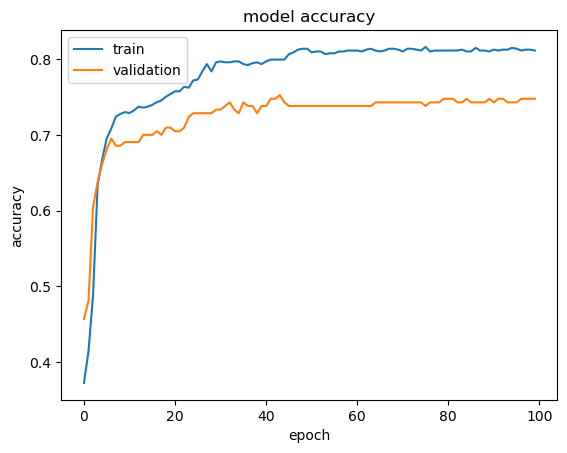

In [115]:
#Summarize history of accuracy
plt.plot(nn.history['accuracy'])
plt.plot(nn.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [ ]:
# Using Confusion matrix heatmap to visualize the model accuracy
sns.heatmap(confusion_matrix(y_test, rfc_pred2), annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.show()

## Compare Accuracy Scores


In [116]:
#All Accuracies
print('NB accuracy: {0:.2f}'.format(NB_all_accuracy))

print("Decision Tree:")
print('All attributes: {0:.2f}'.format(tree_all_accuracy))
print('High importance attributes: {0:.2f}'.format(tree_imp_accuracy))

print("Random Forest:")
print('All attributes: {0:.2f}'.format(RF_all_accuracy))
print('High importance attributes: {0:.2f}'.format(RF_imp_accuracy))

print("Neural Network: ")
print('All attributes: {0:.2f}'.format(nn_accuracy))

NB accuracy: 0.75
Decision Tree:
All attributes: 0.76
High importance attributes: 0.74
Random Forest:
All attributes: 0.77
High importance attributes: 0.77
Neural Network: 
All attributes: 0.72
